In [1]:
import treeswift
import csv
import sys
sys.path.append('/Users/gc3045/miniconda3/lib/python3.11/site-packages')
from ete3 import ClusterTree
from scipy.cluster.hierarchy import linkage
import numpy as np
import dendropy
import pprint
import pandas as pd
import seaborn as sns
from skbio import stats
import matplotlib.pyplot as plt

In [2]:
def edit_distance(x, y, missing_char, ignore_missing=True):
    # assumes aligned
    d = 0
    
    assert len(x) == len(y)
    
    for i in range(len(x)):
        if ignore_missing:
            # print(i, x[i], y[i])
            if x[i] == missing_char or y[i] == missing_char:
                continue
            
        if x[i] != y[i]:
            d += 1
    return d



In [6]:
# # write code for tree to linkage matrix

# import numpy as np

# # def treeswift_to_linkage(t):
# #     """
# #     Convert a TreeSwift tree object into a Scipy-compatible linkage matrix.
    
# #     Parameters:
# #         t (treeswift.Tree): A TreeSwift tree object.
    
# #     Returns:
# #         np.ndarray: A linkage matrix compatible with scipy.cluster.hierarchy.
# #     """
# #     for n in t.traverse_nodes():
# #         if not n.is_leaf():
# #             child = n.
        
# # Example usage with TreeSwift
# import treeswift

# # Example Newick string (replace with your actual tree)
# newick_str = "((A:0.1,B:0.2):0.3,(C:0.4,D:0.5):0.6);"
# t = treeswift.read_tree_newick(newick_str)

# # Convert TreeSwift tree to Scipy linkage matrix
# linkage_matrix = treeswift_to_linkage(t)

# # Print the resulting linkage matrix
# print(linkage_matrix)

In [7]:
# ! pip install ete3

In [41]:
treefile = "/Users/gc3045/scmail_v1/sc-mail-experiments/Real_biodata/TLSCL/evaluation/Bar12/Bar12_improved_final_with_polytomies_merged.nwk"
labelfile = "/Users/gc3045/scmail_v1/sc-mail-experiments/Real_biodata/TLSCL/evaluation/Bar12/Bar12_labels.csv"
cmatfile = "/Users/gc3045/scmail_v1/sc-mail-experiments/Real_biodata/TLSCL/evaluation/Bar12/Bar12_character_matrix.txt"

In [119]:
cmat = pd.read_csv(cmatfile, index_col=0, sep='\t')

In [120]:
labels = pd.read_csv(labelfile, index_col=0, sep='\t')

In [121]:
labels

,LentiBarcode
CellIDs,
AAACCCAGTCTCTCAC-1,2
AAAGGATTCGCACGAC-1,?
AAAGGTAAGAATTGTG-1,4
AAAGGTATCAATGTCG-1,?
AAAGGTATCGACTCCT-1,?
...,...
TTTCATGCAGCACGAA-1,10
TTTCGATTCACCATAG-1,29
TTTCGATTCTCGCCTA-1,2


In [122]:
labels['LentiBarcode'].unique()

array(['2', '?', '4', '7', '10', '12', '13', '14', '15', '18', '22', '23',
       '29', '34', '37'], dtype=object)

In [123]:
color_palette = [
    'red', 'white', 'blue', 'green', 'yellow',  # Valid single-letter colors
    'magenta', 'k',                 # Additional valid single-letter colors
    '#FFA500', '#800080',     # Orange, Purple
    '#008080', '#FF69B4',     # Teal, Hot Pink
    '#8B4513', '#4B0082',     # Saddle Brown, Indigo
    '#00FF00', '#A52A2A'      # Lime, Brown (replacing 'p')
]

m = dict(zip(labels['LentiBarcode'].unique(), color_palette))
labels['Color'] = labels['LentiBarcode'].map(m)


In [124]:
# labels = labels.drop(columns=['LentiBarcode'])
labels

,LentiBarcode,Color
CellIDs,,
AAACCCAGTCTCTCAC-1,2,red
AAAGGATTCGCACGAC-1,?,white
AAAGGTAAGAATTGTG-1,4,blue
AAAGGTATCAATGTCG-1,?,white
AAAGGTATCGACTCCT-1,?,white
...,...,...
TTTCATGCAGCACGAA-1,10,yellow
TTTCGATTCACCATAG-1,29,#4B0082
TTTCGATTCTCGCCTA-1,2,red


In [125]:
edmat = {}
for idx1, row1 in cmat.iterrows():
    x = row1.values
    if idx1 not in edmat:
        edmat[idx1] = {}
    for idx2, row2 in cmat.iterrows():
        y = row2.values
        ed = edit_distance(x, y, -1)
        edmat[idx1][idx2] = ed

Goal is to compute the cophenetic correlation coefficient within the clades attached to the root.

In [126]:
with open(treefile, "r") as r:
    treestr = r.readlines()

In [127]:
t = treeswift.read_tree_newick(treefile)
for l in t.traverse_leaves():
    #print(l.label, labels.loc[l.label]['LentiBarcode'])
    l.original_progenitor_label = labels.loc[l.label]['LentiBarcode']
    for n in l.traverse_ancestors():
        if n.get_parent() == t.root:
            l.laml_progenitor_label = n.label
    print(l.original_progenitor_label, l.laml_progenitor_label)

29 29
29 29
29 29
29 29
29 29
29 29
? 29
2 2
2 2
? 2
? 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
2 2
? 2
? 2
2 2
? 2
? 2
34 34
34 34
34 34
34 34
34 34
34 34
34 34
37 37
? 37
37 37
37 37
? 37
37 37
? 37
? 37
37 37
37 37
37 37
37 37
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
4 4
? 4
? 4
? 4
? 4
? 4
? 4
? 4
4 4
? 4
? 4
? 4
? 4
? 4
? 4
? 4
? 4
? 4
? 4
? 4
4 4
4 4
? 7
? 7
7 7
7 7
7 7
7 7
7 7
7 7
7 7
7 7
? 7
? 7
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
? ?
23 23
? 23
23 23
23 23
23 23
23 23
23 23
22 22
22 22
22 22
22 22
22 22
18 18
18 18
18 18
18 18
18 18
18 18
18 18
18 18
18 18
18 18
18 18
18 18
18 18
? 15
15 15
15 15
15 15
15 15
15 15
? 15
15 15
15 15


In [128]:
# get the average edit distance between each clade
order = []
for c in t.root.children:
    # print(c.label)
    leaves = list(c.traverse_leaves())
    order.extend([x.label for x in leaves])
    # get the edit distance between all clades

In [129]:
labels

,LentiBarcode,Color
CellIDs,,
AAACCCAGTCTCTCAC-1,2,red
AAAGGATTCGCACGAC-1,?,white
AAAGGTAAGAATTGTG-1,4,blue
AAAGGTATCAATGTCG-1,?,white
AAAGGTATCGACTCCT-1,?,white
...,...,...
TTTCATGCAGCACGAA-1,10,yellow
TTTCGATTCACCATAG-1,29,#4B0082
TTTCGATTCTCGCCTA-1,2,red


In [130]:
ordered_cmat = cmat.reindex(order)
# row_colors = labels.set_index('cell_names')['Color']
unique_labels = labels['LentiBarcode'].unique()
unique_colors = labels['Color'].unique()
legend_handles = [plt.Line2D([0], [0], marker='o', color=color, linestyle='', markersize=10) 
                  for color in unique_colors]

In [131]:
labels = labels.rename(columns={'Color': 'Label'})

In [132]:
ordered_cmat

,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,...,r21,r22,r23,r24,r25,r26,r27,r28,r29,r30
GACCGTGGTCACTTAG-1,-1,-1,-1,30,9,0,0,0,0,0,...,0,6,20,0,0,3,0,-1,-1,-1
GTAACACGTAACAGTA-1,-1,-1,-1,30,9,0,-1,-1,-1,28,...,0,6,20,0,-1,-1,-1,-1,-1,-1
GCGGATCCAATAGAGT-1,0,0,0,30,9,0,-1,-1,-1,0,...,0,6,20,0,-1,-1,-1,-1,-1,-1
CACCAAAAGTAAGAGG-1,0,0,0,0,32,0,0,9,0,20,...,0,0,9,0,0,17,0,-1,-1,-1
CTCAGAACAACTGAAA-1,0,0,0,0,0,0,0,0,0,0,...,-1,0,0,0,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCGATTCACCATAG-1,30,18,0,0,7,0,4,23,0,-1,...,0,37,8,0,-1,-1,-1,-1,-1,-1
TTCTGTAGTTCCTACC-1,3,18,0,0,0,0,4,23,0,5,...,0,36,50,0,-1,-1,-1,-1,-1,-1
TTCTTGAAGAGCCCAA-1,3,18,0,0,0,0,4,23,0,5,...,0,3,4,0,-1,-1,-1,-1,-1,-1
ATCAGGTCAGCACGAA-1,3,18,0,19,27,0,4,23,0,0,...,0,6,8,0,-1,-1,-1,-1,-1,-1


In [133]:
tmp_m = 0
for l in t.traverse_leaves():
    
    # idx = np.where(l.label == labels.index)[0][0]
    #if l.laml_progenitor_label == '?':
    #    tmp_m += 1
    labels.loc[l.label, 'LAML_progenitor_label'] = l.laml_progenitor_label
            

In [134]:
tmp_m

0

In [135]:
labels

,LentiBarcode,Label,LAML_progenitor_label
CellIDs,,,
AAACCCAGTCTCTCAC-1,2,red,2
AAAGGATTCGCACGAC-1,?,white,13
AAAGGTAAGAATTGTG-1,4,blue,4
AAAGGTATCAATGTCG-1,?,white,2
AAAGGTATCGACTCCT-1,?,white,?
...,...,...,...
TTTCATGCAGCACGAA-1,10,yellow,10
TTTCGATTCACCATAG-1,29,#4B0082,29
TTTCGATTCTCGCCTA-1,2,red,2


In [136]:
labels['LAML_color'] = labels['LAML_progenitor_label'].map(m)


In [137]:
labels

,LentiBarcode,Label,LAML_progenitor_label,LAML_color
CellIDs,,,,
AAACCCAGTCTCTCAC-1,2,red,2,red
AAAGGATTCGCACGAC-1,?,white,13,k
AAAGGTAAGAATTGTG-1,4,blue,4,blue
AAAGGTATCAATGTCG-1,?,white,2,red
AAAGGTATCGACTCCT-1,?,white,?,white
...,...,...,...,...
TTTCATGCAGCACGAA-1,10,yellow,10,yellow
TTTCGATTCACCATAG-1,29,#4B0082,29,#4B0082
TTTCGATTCTCGCCTA-1,2,red,2,red


In [138]:
row_colors = pd.DataFrame({'Exp.': labels['Label'],
              'LAML': labels['LAML_color']})

In [139]:
# binarize the dataframe
binarized_df = pd.get_dummies(ordered_cmat, columns=ordered_cmat.columns, prefix_sep='_')


In [192]:
binarized_df

,r1_-1,r1_0,r1_1,r1_2,r1_3,r1_4,r1_5,r1_6,r1_7,r1_8,...,r26_33,r27_-1,r27_0,r27_1,r28_-1,r28_1,r29_-1,r29_1,r30_-1,r30_0
GACCGTGGTCACTTAG-1,True,False,False,False,False,False,False,False,False,False,...,False,False,True,False,True,False,True,False,True,False
GTAACACGTAACAGTA-1,True,False,False,False,False,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
GCGGATCCAATAGAGT-1,False,True,False,False,False,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
CACCAAAAGTAAGAGG-1,False,True,False,False,False,False,False,False,False,False,...,False,False,True,False,True,False,True,False,True,False
CTCAGAACAACTGAAA-1,False,True,False,False,False,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCGATTCACCATAG-1,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
TTCTGTAGTTCCTACC-1,False,False,False,False,True,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
TTCTTGAAGAGCCCAA-1,False,False,False,False,True,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
ATCAGGTCAGCACGAA-1,False,False,False,False,True,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False


In [198]:
leaf_order = list(binarized_df.index)

In [203]:
t.distance_matrix()

{<treeswift.Node.Node at 0x324625750>: {<treeswift.Node.Node at 0x324626950>: 0.18215810050991843,
  <treeswift.Node.Node at 0x324624390>: 0.6390172619244221,
  <treeswift.Node.Node at 0x324627790>: 1.3515128452467695,
  <treeswift.Node.Node at 0x324626710>: 1.6707827584334083,
  <treeswift.Node.Node at 0x324624710>: 1.6707827584334083,
  <treeswift.Node.Node at 0x324625290>: 1.6707827584334083,
  <treeswift.Node.Node at 0x3246252d0>: 1.670782758207273,
  <treeswift.Node.Node at 0x324625890>: 1.670782758207273,
  <treeswift.Node.Node at 0x324625a10>: 1.670782758207273,
  <treeswift.Node.Node at 0x324626010>: 1.670782758207273,
  <treeswift.Node.Node at 0x324626c10>: 1.6707827581430768,
  <treeswift.Node.Node at 0x3246254d0>: 1.6707827581430768,
  <treeswift.Node.Node at 0x324625210>: 1.6707827581533143,
  <treeswift.Node.Node at 0x324625e10>: 1.6707827581533143,
  <treeswift.Node.Node at 0x324624ed0>: 1.6707827581533143,
  <treeswift.Node.Node at 0x324624810>: 1.6707827581430768,
  <tr

In [210]:
#convert tree to linkage matrix
t_str = t.newick()

import scipy.spatial.distance as ssd
import scipy.cluster.hierarchy as sch

t_distmat = t.distance_matrix()
new_distmat = {}
for x in t_distmat:
    new_distmat[x.label] = {}
    for y in t_distmat[x]:
        new_distmat[x.label][y.label] = t_distmat[x][y]
new_distmat

dist_mat = pd.DataFrame.from_dict(new_distmat).fillna(0)

dist_mat = dist_mat.reindex(columns=leaf_order, index=leaf_order)

#dist_mat = dist_mat.sort_index(axis=1).sort_index(axis=0)
#dist_mat
distArray = ssd.squareform(dist_mat)
schlink = sch.linkage(distArray,method='average',metric='euclidean')


In [211]:
schlink

array([[4.50000000e+01, 4.60000000e+01, 1.28960026e-02, 2.00000000e+00],
       [3.04000000e+02, 3.05000000e+02, 1.28960027e-02, 2.00000000e+00],
       [3.06000000e+02, 3.64000000e+02, 1.28960027e-02, 3.00000000e+00],
       ...,
       [7.07000000e+02, 7.21000000e+02, 2.00000000e+00, 3.51000000e+02],
       [6.40000000e+02, 7.22000000e+02, 2.00000000e+00, 3.58000000e+02],
       [6.70000000e+02, 7.23000000e+02, 2.00000000e+00, 3.63000000e+02]])

In [142]:
binarized_df

,r1_-1,r1_0,r1_1,r1_2,r1_3,r1_4,r1_5,r1_6,r1_7,r1_8,...,r26_33,r27_-1,r27_0,r27_1,r28_-1,r28_1,r29_-1,r29_1,r30_-1,r30_0
GACCGTGGTCACTTAG-1,True,False,False,False,False,False,False,False,False,False,...,False,False,True,False,True,False,True,False,True,False
GTAACACGTAACAGTA-1,True,False,False,False,False,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
GCGGATCCAATAGAGT-1,False,True,False,False,False,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
CACCAAAAGTAAGAGG-1,False,True,False,False,False,False,False,False,False,False,...,False,False,True,False,True,False,True,False,True,False
CTCAGAACAACTGAAA-1,False,True,False,False,False,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCGATTCACCATAG-1,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
TTCTGTAGTTCCTACC-1,False,False,False,False,True,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
TTCTTGAAGAGCCCAA-1,False,False,False,False,True,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False
ATCAGGTCAGCACGAA-1,False,False,False,False,True,False,False,False,False,False,...,False,True,False,False,True,False,True,False,True,False


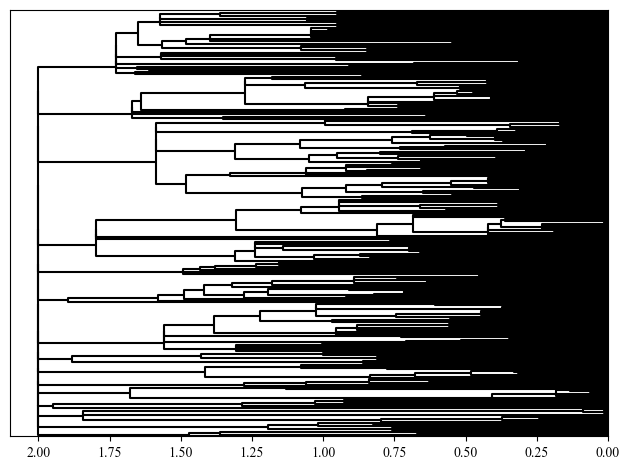

In [212]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
import numpy as np

# Function to return black for all links
def link_color_func(k):
    return 'black'

# Create the dendrogram
d = dendrogram(schlink, orientation="left", truncate_mode=None, 
               link_color_func=link_color_func,
               leaf_font_size=0,  # Hide leaf labels
               leaf_rotation=0,
               no_labels=True)  # Ensure no labels are shown

# # Get the leaf coordinates
# leaf_x = [v[0] for v in d['icoord']]
# leaf_y = [v[1] for v in d['dcoord']]

# # Plot colored nodes for leaves
# for i, (x, y) in enumerate(zip(leaf_x, leaf_y)):
#     if i < len(row_colors['Exp.']):
#         color = row_colors['Exp.'][row_colors['Exp.'].index[i]]
#         plt.plot(y, x, 'o', color=color, markersize=5, zorder=5)

plt.tight_layout()
plt.show()


/opt/homebrew/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


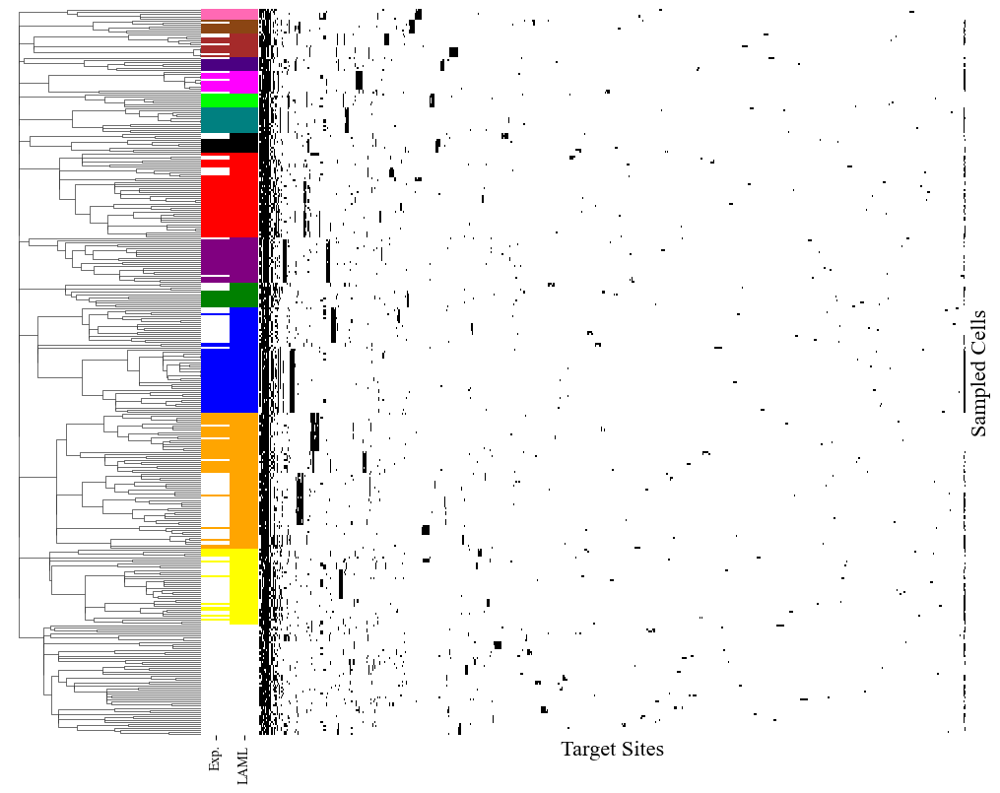

In [214]:
plt.rcParams['font.family'] = 'Times New Roman'

plot_cmat = binarized_df
#plot_cmat = plot_cmat.mask(ordered_cmat == -1, np.nan)
# plot_cmat

cmap = plt.get_cmap('Greys')
cmap.set_bad('white')
cmap.set_under('white')

g = sns.clustermap(plot_cmat, 
               row_cluster=True, col_cluster=True, 
               row_linkage = schlink, 
               tree_kws={"linewidths": 0.5},
               row_colors=row_colors, # labels["Label"], 
               yticklabels=False, xticklabels=False, cbar_pos=None, vmin=0.5, cmap=cmap) 

#mask = plot_cmat.mask(plot_cmat == -1, True) 
#values = g.ax_heatmap.collections[0].get_array().reshape(plot_cmat.shape)
#new_values = np.ma.array(values, mask=mask) # true indicates masked invalid data

#g.ax_heatmap.collections[0].set_array(new_values)

def link_color_func(k):
    return 'black'

#d = dendrogram(schlink, ax=g.ax_row_dendrogram, orientation="left")
# d = dendrogram(schlink, orientation="left", truncate_mode=None, 
#                link_color_func=link_color_func,
#                #leaf_font_size=0,  # Hide leaf labels
#                #leaf_rotation=0,
#                ax=g.ax_row_dendrogram,
#                no_labels=True)  # Ensure no labels are shown

g.ax_row_dendrogram.set_visible(True)
g.ax_col_dendrogram.set_visible(False)
#g.ax_heatmap.xaxis.set_tick_params(labelrotation=45)

# g.gs.update(left=0.05, right=0.95)
g.ax_heatmap.set_xlabel("Target Sites", fontsize=16)
g.ax_heatmap.set_ylabel("Sampled Cells", fontsize=16)
plt.savefig("sample12_indel_heatmap_new.pdf", bbox_inches='tight', pad_inches=0)


In [ ]:
# cluster all the cells [done]
# put the tree on the left hand side
# binarize the states try this version [done]
# consider quantifying with correlation

In [30]:

# g = sns.clustermap(ordered_cmat, 
#                row_cluster=False, col_cluster=False, row_colors=labels["Label"], 
#                yticklabels=False, xticklabels=False, cbar_pos=None) # cmap='gnuplot')
# g.ax_heatmap.set_xlabel("Target Sites", fontsize=12)
# g.ax_heatmap.set_ylabel("Sampled Cells", fontsize=12)

# cmap = plt.get_cmap('cividis')
# cmap.set_bad('pink')
# cmap.set_under('white')
# tmp_df = ordered_cmat.mask(ordered_cmat == -1, np.nan) #(tmp_df, -1)

g.ax_row_dendrogram.legend(
    handles=legend_handles,
    labels=list(unique_labels),
    title="LentiBarcode Label",
    loc="center left", #vmin=0.5,
    bbox_to_anchor=(0.2, 0.5),  # Adjust position relative to the plot
    frameon=True  # Optional: Add a frame around the legend
)
plt.show()
plt.savefig("sample12_indel_heatmap.pdf")


<Figure size 640x480 with 0 Axes>

In [166]:
# compute edit distance within the clade
x_labels = []
all_edit_distances = []
for c in t.root.children:
    clade_ed = []
    leaves = list([x.label for x in c.traverse_leaves()])
    num_leaves = len(leaves)
    for i in range(num_leaves):
        for j in range(i, (num_leaves)):
            if i != j:
                u = leaves[i]
                v = leaves[j]
                d = edmat[u][v]
                clade_ed.append(d)
    # print(c.label, np.mean(clade_ed))
    all_edit_distances.append(clade_ed)
    x_labels.append(c.label)

<Figure size 800x600 with 0 Axes>

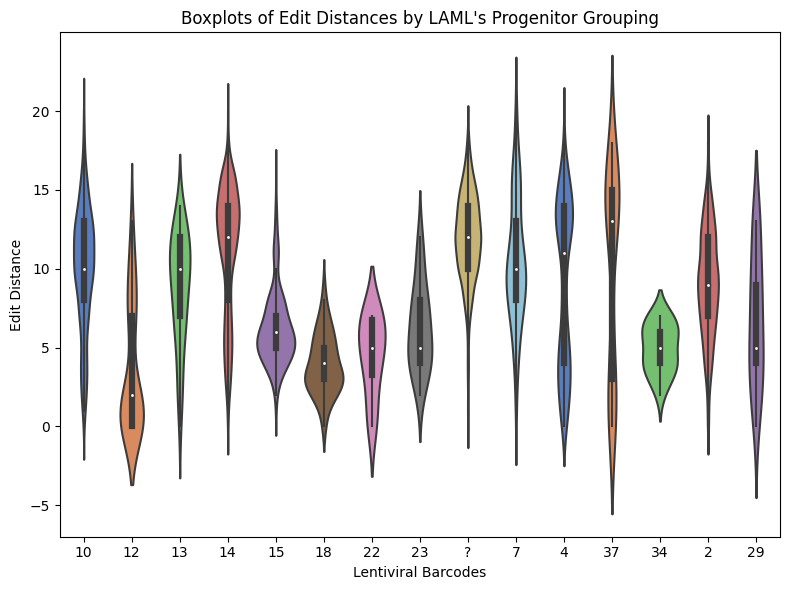

In [188]:
plt.figure(figsize=(8, 6))
#plt.boxplot(all_edit_distances, labels=x_labels, patch_artist=True, boxprops=dict(facecolor='lightblue'))

# Prepare data for violin plot
data = []
all_labels = []
for label, distances in zip(x_labels, all_edit_distances):
    data.extend(distances)
    all_labels.extend([label] * len(distances))

# Create violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(x=all_labels, y=data, palette="muted")

# Add labels and title
plt.xlabel("Lentiviral Barcodes")
plt.ylabel("Edit Distance")
plt.title("Boxplots of Edit Distances by LAML's Progenitor Grouping")

plt.tight_layout()
plt.show()

In [191]:
# compute edit distance within the clade
givenlabel_x_labels = []
givenlabel_all_edit_distances = []
for barcode, group in labels.groupby("LentiBarcode"):
    #print(f"LentiBarcode: {barcode}")
    #print(f"Row indices: {group.index.tolist()}")
    clade_ed = []
    clade_leaves = group.index.tolist()
    num_leaves = len(clade_leaves)
    for i in range(num_leaves):
        for j in range(i, num_leaves):
            if i != j:
                u = clade_leaves[i]
                v = clade_leaves[j]
                d = edmat[u][v]
                clade_ed.append(d)

    givenlabel_all_edit_distances.append(clade_ed)
    givenlabel_x_labels.append(barcode)

<Figure size 800x600 with 0 Axes>

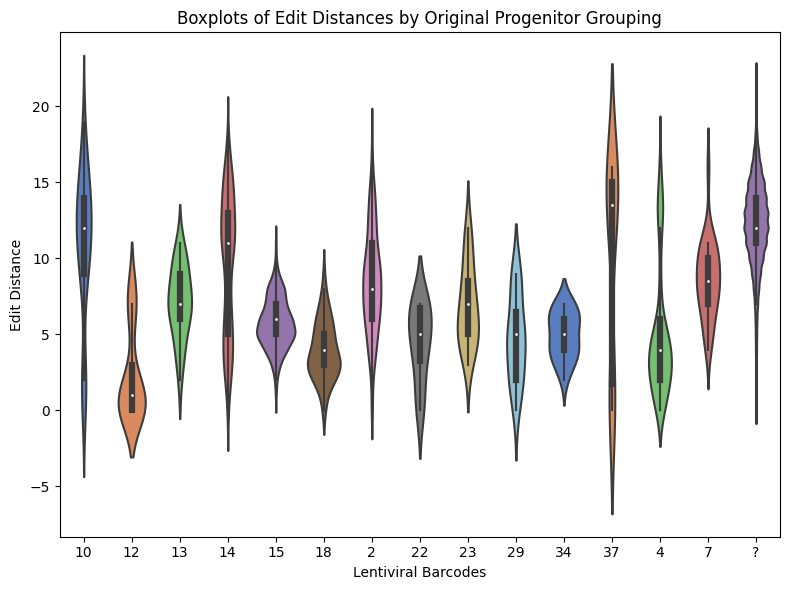

In [192]:
plt.figure(figsize=(8, 6))
#plt.boxplot(all_edit_distances, labels=x_labels, patch_artist=True, boxprops=dict(facecolor='lightblue'))

# Prepare data for violin plot
data = []
all_labels = []
for label, distances in zip(givenlabel_x_labels, givenlabel_all_edit_distances):
    data.extend(distances)
    all_labels.extend([label] * len(distances))

# Create violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(x=all_labels, y=data, palette="muted")

# Add labels and title
plt.xlabel("Lentiviral Barcodes")
plt.ylabel("Edit Distance")
plt.title("Boxplots of Edit Distances by Original Progenitor Grouping")

plt.tight_layout()
plt.show()

In [193]:
# split violin plot

# Reformat data into a DataFrame
data = []
for x_label, distances in zip(x_labels, all_edit_distances):
    for value in distances:
        data.append({'x_label': x_label, 'y_value': value, 'set': 'LAML Progenitors'})
        
for x_label, distances in zip(givenlabel_x_labels, givenlabel_all_edit_distances):
    for value in distances:
        data.append({'x_label': x_label, 'y_value': value, 'set': 'Original Progenitors'})
        
data_df = pd.DataFrame(data)


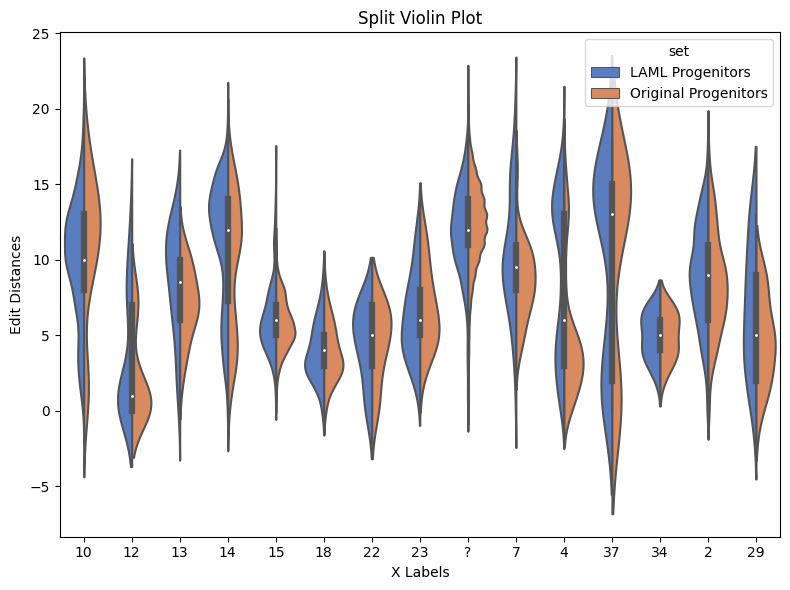

In [194]:
plt.figure(figsize=(8,6))
sns.violinplot(x='x_label', y='y_value', hue='set', data=data_df, split=True, palette='muted')

# Add labels and title
plt.xlabel('X Labels')
plt.ylabel('Edit Distances')
plt.title('Split Violin Plot')

plt.tight_layout()
plt.show()

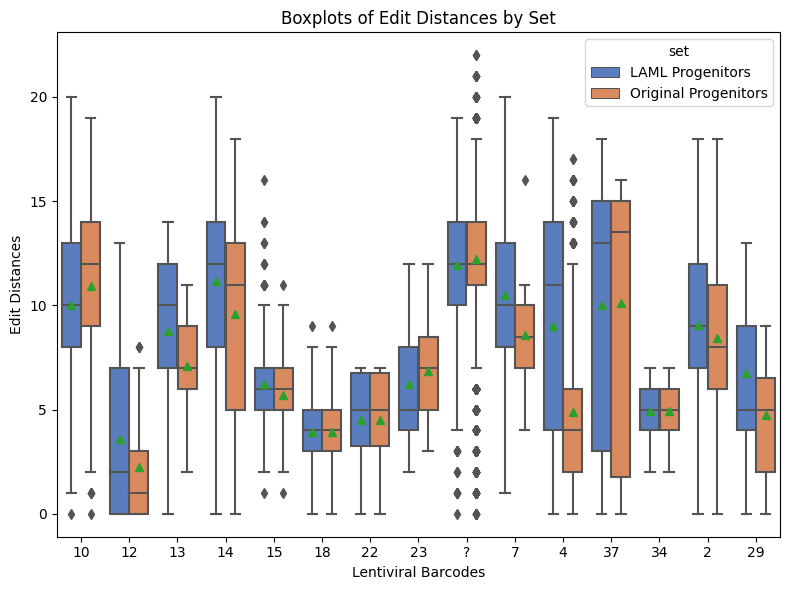

In [214]:
# Plot boxplots
plt.figure(figsize=(8, 6))
sns.boxplot(x='x_label', y='y_value', hue='set', 
            showmeans=True,
            data=data_df, palette='muted')


# Add labels and title
plt.xlabel('Lentiviral Barcodes')
plt.ylabel('Edit Distances')
plt.title('Boxplots of Edit Distances by Set')

# Adjust layout and show the plot
plt.tight_layout()
# plt.show()
plt.savefig("Bar12_editdistance_boxplots.pdf")

In [206]:
'AAGACAATCCACTTTA-1' in set(cmat.index.values.tolist())

True

In [232]:
l2n = t.label_to_node()

In [246]:
# get defining indels of a set of cells
for barcode, group in labels.groupby("LentiBarcode"):
    # if barcode is '?' check if this cell is now grouped with its min edit distance sister
    if barcode == '?':
    
        clade_leaves = group.index.tolist()
        for leaf in clade_leaves:
            
            min_sis_ed = min(edmat[leaf].values())
            all_sis = [x for x in edmat[leaf] if edmat[leaf][x] == min_sis_ed]
            # print(all_sis)
            # sis = min(edmat[leaf], key=edmat[leaf].get)
            
            my_laml_progenitor_label = l2n[leaf].laml_progenitor_label
            my_original_progenitor_label = l2n[leaf].original_progenitor_label
            
            sis_laml_progenitor_labels = set([l2n[sis].laml_progenitor_label for sis in all_sis])
            sis_original_progenitor_labels = set([l2n[sis].original_progenitor_label for sis in all_sis])
            
            if my_laml_progenitor_label != my_original_progenitor_label:
                print(my_laml_progenitor_label, my_original_progenitor_label,
                     sis_laml_progenitor_labels, sis_original_progenitor_labels)
                
            if my_original_progenitor_label not in sis_original_progenitor_label:
                print(my_laml_progenitor_label, sis_laml_progenitor_label, my_original_progenitor_label, sis_original_progenitor_label)
                print(my_laml_progenitor_label == sis_laml_progenitor_label, 
                  my_original_progenitor_label == sis_original_progenitor_label)
            
        break

13 ? {'13'} {'?'}
2 ? {'2'} {'?'}
7 ? {'7'} {'?'}
14 ? {'14'} {'?'}
10 ? {'10'} {'?'}
7 ? {'7'} {'?'}
14 ? {'14'} {'?'}
14 ? {'14'} {'?'}
4 ? {'4'} {'?'}
14 ? {'14'} {'?'}
10 ? {'10'} {'?'}
10 ? {'10'} {'?'}
7 ? {'7'} {'?'}
2 ? {'2'} {'?'}
37 ? {'37'} {'?'}
4 ? {'4'} {'?'}
10 ? {'10'} {'?'}
4 ? {'4'} {'?'}
4 ? {'4'} {'?'}
10 ? {'10'} {'?'}
14 ? {'14'} {'?'}
10 ? {'10'} {'?'}
10 ? {'10'} {'?'}
14 ? {'14'} {'?'}
13 ? {'13'} {'?'}
4 ? {'4'} {'?'}
4 ? {'4'} {'?'}
14 ? {'14'} {'?'}
14 ? {'14'} {'?'}
14 ? {'14'} {'?'}
4 ? {'4'} {'?'}
10 ? {'10'} {'?'}
10 ? {'10'} {'?'}
4 ? {'4'} {'?'}
10 ? {'10'} {'?'}
14 ? {'14'} {'?'}
10 ? {'10'} {'?'}
10 ? {'10'} {'?'}
15 ? {'15'} {'?'}
7 ? {'7'} {'?'}
4 ? {'4'} {'?'}
10 ? {'10'} {'?'}
14 ? {'14'} {'?'}
14 ? {'14'} {'?'}
10 ? {'10'} {'?'}
4 ? {'4'} {'?'}
23 ? {'23'} {'?'}
37 ? {'37'} {'?'}
14 ? {'14'} {'?'}
14 ? {'14'} {'?'}
4 ? {'4'} {'?'}
14 ? {'14'} {'?'}
4 ? {'4'} {'?'}
14 ? {'14'} {'?'}
14 ? {'14'} {'?'}
2 ? {'2'} {'?'}
15 ? {'15'} {'?'}
13 ? {'13'} 

In [176]:
print(labels['LentiBarcode'].value_counts())

LentiBarcode
?     160
2      36
4      35
14     32
15     21
18     13
10     11
7       8
12      8
37      8
13      7
34      7
23      6
29      6
22      5
Name: count, dtype: int64


In [13]:
len(t.root.children)

15

In [170]:
for c in t.root.children:
    print(c.label, len(list([x for x in c.traverse_leaves()])))

10 38
12 11
13 10
14 68
15 23
18 13
22 5
23 7
? 55
7 12
4 53
37 12
34 7
2 42
29 7


In [15]:
def compute_cc(t, c, edmat): 
        
    cophenet_dict = {}
    leaves = list(c.traverse_leaves())
    root = c
    
    for i in range(len(leaves)):
        from_node = leaves[i]
        if from_node.label not in cophenet_dict:
            cophenet_dict[from_node.label] = {}
        for j in range(len(leaves)):
            if j <= i:
                pass
            to_node = leaves[j]     
            mrca = t.mrca({from_node.label, to_node.label}) 
            h = t.distance_between(mrca, c)
            cophenet_dict[from_node.label][to_node.label] = h
            

    # convert into matrices
    edmat_subset = []
    cophen_mat = []
    leaf_labels = [x.label for x in leaves]
    for u in leaf_labels:
        cophen_row = []
        edmat_row = []
        for v in leaf_labels:
            if u == v:
                cd = 0
                ed = 0
            else:                
                if u in cophenet_dict.keys() and v in cophenet_dict[u].keys():
                    cd = cophenet_dict[u][v]
                else:
                    cd = cophenet_dict[v][u]
                    
                if u in edmat.keys() and v in edmat.keys():
                    ed = edmat[u][v]
                
            cophen_row.append(cd)
            edmat_row.append(ed)
        cophen_mat.append(cophen_row)
        edmat_subset.append(edmat_row)
        
    cophen_mat = np.matrix(cophen_mat)
    edmat_mat = np.matrix(edmat_subset)
    # print(cophen_mat.shape, edmat_mat.shape)
    #return cophen_mat
    return leaf_labels, cophen_mat, edmat_mat, stats.distance.mantel(edmat_mat, cophen_mat)
    # return cophen_mat

In [16]:
idx = 1
for node in t.traverse_preorder():
    if node.label is None:
        node.label = f"tmp_label_{idx}"
        idx += 1

In [17]:
edmatne

NameError: name 'edmatne' is not defined

In [173]:
for c in t.root.children:
    leaf_labels, cophen_mat, edmat_subset, m = compute_cc(t, c, edmat)
    print(c.label, m)

10 (-0.6848838964792394, 0.001, 38)
12 (-0.8909419734680397, 0.001, 11)
13 (-0.8624016067455547, 0.001, 10)
14 (-0.794245015831559, 0.001, 68)
15 (-0.701931935958529, 0.001, 23)
18 (-0.26097665493772276, 0.147, 13)
22 (-0.8628510298398544, 0.086, 5)
23 (-0.5531612710501947, 0.005, 7)
? (-0.3264466159845816, 0.001, 55)
7 (-0.5813941860797738, 0.002, 12)
4 (-0.8279579482657998, 0.001, 53)
37 (-0.9696289364486175, 0.001, 12)
34 (-0.35153442154868814, 0.272, 7)
2 (-0.639086405585101, 0.001, 42)
29 (-0.8860453940565961, 0.012, 7)


['GACCGTGGTCACTTAG-1', 'GTAACACGTAACAGTA-1', 'GCGGATCCAATAGAGT-1', 'CACCAAAAGTAAGAGG-1', 'CTCAGAACAACTGAAA-1', 'AGGGAGTTCGCGTGAC-1', 'TCAGCCTAGGTAAGAG-1', 'TTGCATTGTCGAGCAA-1', 'CTCCTTTAGAGGCGTT-1', 'ACTTCGCCAATAGAGT-1', 'AGATAGACAGCTGAAG-1', 'GGGTATTCACCAAAGG-1', 'GCATTAGGTATGTCCA-1', 'TCATTTGAGCTCACTA-1', 'CATTCTAAGAATTGTG-1', 'CTGTAGAAGAGGGTAA-1', 'ACCTACCCAGAGAGGG-1', 'CGTAGTAAGACCAGAC-1', 'CAGCAATGTCCAGAAG-1', 'TCATGGAAGAACAAGG-1', 'TGCGACGCAGTCAGCC-1', 'AGCCACGGTCATCAGT-1', 'CAGCACGGTGAGTAAT-1', 'TTGGATGAGGAGTATT-1', 'AACGTCAGTTTACACG-1', 'CATAAGCCACTTCAGA-1', 'GTTATGGTCGGTAAGG-1', 'ACCGTTCTCTTCCGTG-1', 'GTCCCATCAGACCGCT-1', 'CACTTCGTCCCTCGAT-1', 'CACGAATGTCGCATCG-1', 'AGTAACCCAGACTGCC-1', 'GTAACACCAAGGGTCA-1', 'TTTCATGCAGCACGAA-1', 'CTGTCGTGTCTGGTTA-1', 'AGTCAACCACATCATG-1', 'AAGACAATCCACTTTA-1', 'AGCGTATTCGGAGTGA-1']


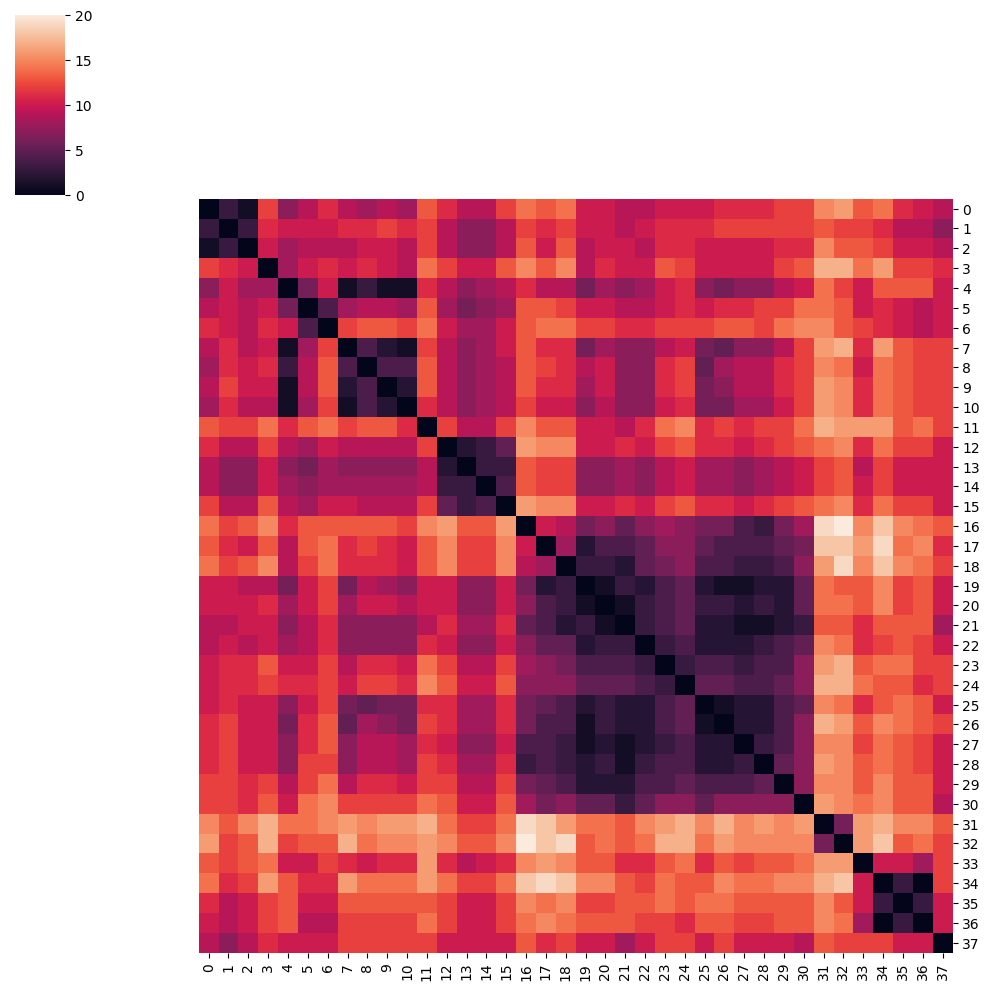

In [182]:
for c in t.root.children:
    leaf_labels, cophen_mat, edmat_subset, m = compute_cc(t, c, edmat)
    print(leaf_labels)
    sns.clustermap(edmat_subset, row_cluster=False, col_cluster=False)
    break

/opt/homebrew/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


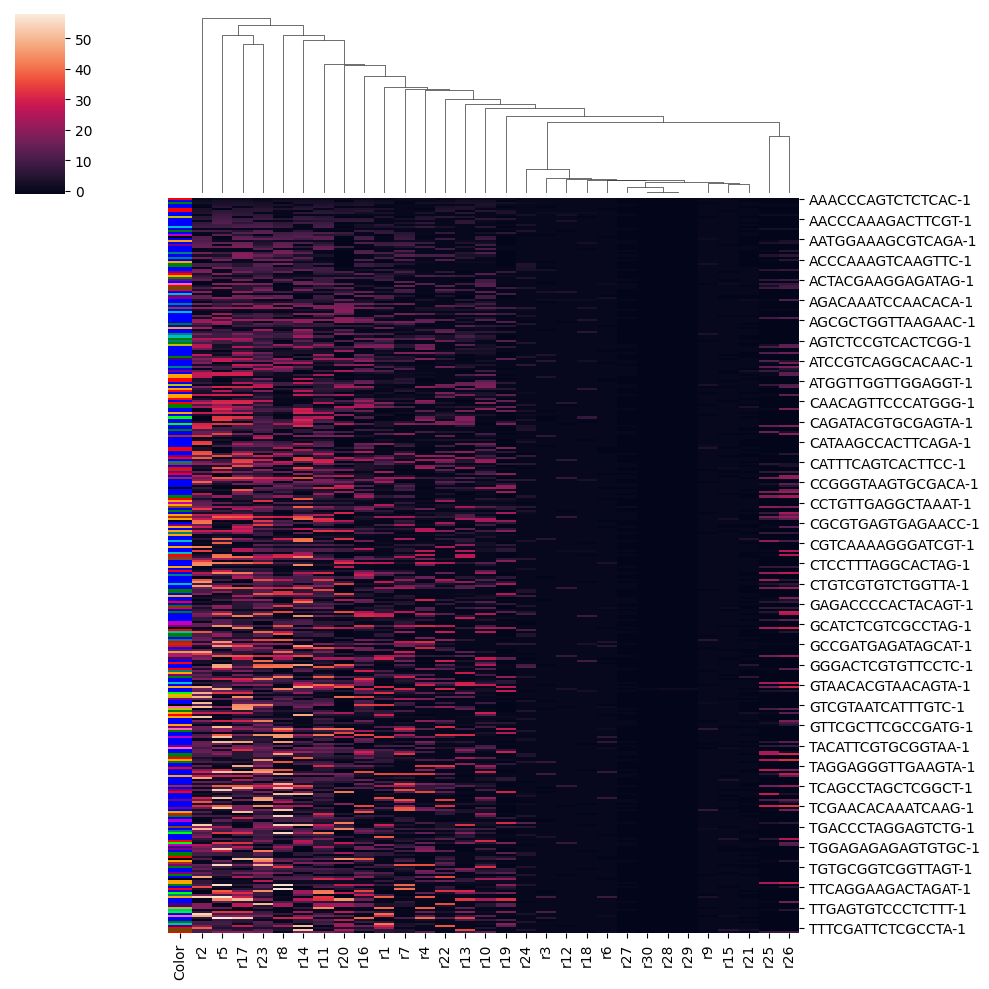

In [117]:
# row_colors = labels.map(m)
# row_colors
sns.clustermap(cmat, row_cluster=False, row_colors=labels)

In [101]:
# drop annotations on the bottom, re-order the columns...

,LentiBarcode
CellIDs,
AAACCCAGTCTCTCAC-1,2
AAAGGATTCGCACGAC-1,?
AAAGGTAAGAATTGTG-1,4
AAAGGTATCAATGTCG-1,?
AAAGGTATCGACTCCT-1,?
...,...
TTTCATGCAGCACGAA-1,10
TTTCGATTCACCATAG-1,29
TTTCGATTCTCGCCTA-1,2


In [102]:
cmat

,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,...,r21,r22,r23,r24,r25,r26,r27,r28,r29,r30
AAACCCAGTCTCTCAC-1,0,0,0,1,1,0,1,1,0,1,...,0,0,0,0,-1,-1,-1,-1,-1,-1
AAAGGATTCGCACGAC-1,1,1,0,0,2,0,0,2,0,2,...,-1,1,1,0,-1,-1,-1,-1,-1,-1
AAAGGTAAGAATTGTG-1,2,2,0,2,3,0,-1,-1,-1,3,...,0,2,2,1,-1,-1,-1,-1,-1,-1
AAAGGTATCAATGTCG-1,0,0,0,0,4,0,0,3,0,4,...,0,0,3,0,0,0,0,-1,-1,-1
AAAGGTATCGACTCCT-1,-1,-1,-1,0,5,0,0,0,0,2,...,-1,3,4,0,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCATGCAGCACGAA-1,41,9,0,5,10,0,3,8,0,1,...,0,0,11,0,-1,-1,-1,-1,-1,-1
TTTCGATTCACCATAG-1,30,18,0,0,7,0,4,23,0,-1,...,0,37,8,0,-1,-1,-1,-1,-1,-1
TTTCGATTCTCGCCTA-1,21,38,0,0,4,0,0,3,0,4,...,0,0,3,0,-1,-1,-1,-1,-1,-1
TTTGACTAGCGTCAAG-1,6,10,0,0,9,0,4,4,0,0,...,2,0,12,4,-1,-1,-1,-1,-1,-1
